In [1]:
using Plots
using LaTeXStrings
using LinearAlgebra
using Random
using Distributions
# using FFTW
# using FFTA
# using Pkg
# Pkg.add("AbstractGPs")
# Pkg.add("LogExpFunctions")
using AbstractGPs, LogExpFunctions, Turing
using ForwardDiff


In [2]:

function fft(x::AbstractVector)
    N = length(x)
    @assert ispow2(N) "Length must be a power of 2"
    # Make a working copy
    y = complex.(copy(x))

    # 1) Bit‑reversal permutation
    bits = Int(floor(log2(N)))
    for i in 0:(N-1)
        j = bitreverse(i) >>> (sizeof(Int)*8 - bits)
        if j > i
            y[i+1], y[j+1] = y[j+1], y[i+1]
        end
    end

    # 2) Cooley‑Tuk decimation‑in‑place
    m = 1
    while m < N
        half = m
        m *= 2
        # principal m‑th root of unity: exp(-2πi/m)
        wm = cis(-2π/m)
        for k in 1:m:N
            w = one(wm)
            for j in 0:(half-1)
                u = y[k + j]
                t = w * y[k + j + half]
                y[k + j]          = u + t
                y[k + j + half]   = u - t
                w *= wm
            end
        end
    end

    return y
end

function ifft(x::AbstractVector)
    N = length(x)
    @assert ispow2(N) "Length must be a power of 2"
    # Make a working copy
    y = complex.(copy(x))

    # 1) Bit‑reversal permutation
    bits = Int(floor(log2(N)))
    for i in 0:(N-1)
        j = bitreverse(i) >>> (sizeof(Int)*8 - bits)
        if j > i
            y[i+1], y[j+1] = y[j+1], y[i+1]
        end
    end

    # 2) Cooley‑Tuk decimation‑in‑place
    m = 1
    while m < N
        half = m
        m *= 2
        # principal m‑th root of unity: exp(-2πi/m)
        wm = cis(2π/m)
        for k in 1:m:N
            w = one(wm)
            for j in 0:(half-1)
                u = y[k + j]
                t = w * y[k + j + half]
                y[k + j]          = u + t
                y[k + j + half]   = u - t
                w *= wm
            end
        end
    end

    return y
end

ifft (generic function with 1 method)

In [3]:

function fft(A::AbstractMatrix)
    Ny, Nx = size(A)
    @assert ispow2(Ny) && ispow2(Nx) "Both dimensions must be powers of 2"
    B = copy(A)

    # 1) FFT down each column
    @inbounds @simd for x in 1:Nx
        B[:, x] = fft(view(B, :, x))
    end

    # 2) FFT across each row of the intermediate result
    @inbounds @simd for y in 1:Ny
        B[y, :] = fft(view(B, y, :))
    end
    return B
end

function ifft(A::AbstractMatrix)
    Ny, Nx = size(A)
    @assert ispow2(Ny) && ispow2(Nx) "Both dimensions must be powers of 2"
    B = copy(A)

    # 1) FFT down each column
    @inbounds @simd for x in 1:Nx
        B[:, x] = ifft(view(B, :, x))
    end

    # 2) FFT across each row of the intermediate result
    @inbounds @simd for y in 1:Ny
        B[y, :] = ifft(view(B, y, :))
    end
    return B
end

ifft (generic function with 2 methods)

In [4]:
function custom_fftshift(A::AbstractMatrix)
    n1, n2 = size(A)
    idx1 = vcat((div(n1,2)+1):n1, 1:div(n1,2))
    idx2 = vcat((div(n2,2)+1):n2, 1:div(n2,2))
    return A[idx1, idx2]
end
function custom_fftshift(A::AbstractVector)
    n1 = length(A)
    idx1 = vcat((div(n1,2)+1):n1, 1:div(n1,2))
    return A[idx1]
end

function fftnshift(A::AbstractArray)
    B = copy(A)
    return custom_fftshift(fft(custom_fftshift(B)))
end
function ifftnshift(A::AbstractArray)
    B = copy(A)
    return custom_fftshift(ifft(custom_fftshift(B)))./(reduce(*,size(B)))
end

ifftnshift (generic function with 1 method)

In [5]:
function meshgrid(x,y)
    n = length(y)
    m = length(x)
    X = Matrix{eltype(x)}(undef, n, m)
    Y = Matrix{eltype(y)}(undef, n, m)
    @views @simd for i in eachindex(y)
        X[i,:] = x
    end
    @views @simd for j in eachindex(x)
        Y[:,j] = y
    end
    return X, Y
end
# function fftnshift(A::AbstractArray)
#     B = copy(A)
#     return fftshift(fft(fftshift(B)))
# end
# function ifftnshift(A::AbstractArray)
#     B = copy(A)
#     return fftshift(ifft(ifftshift(B)))
# end
function Autocorrelation(image)
    # the image is assumed to be in real space
    
    image_fft = fftnshift(image)
    image_auto = ifftnshift(image_fft .* conj.(image_fft))
    if eltype(image) <: Real 
        return real.(image_auto)
    end
    return image_auto
end

Autocorrelation (generic function with 1 method)

0.07509467367427668


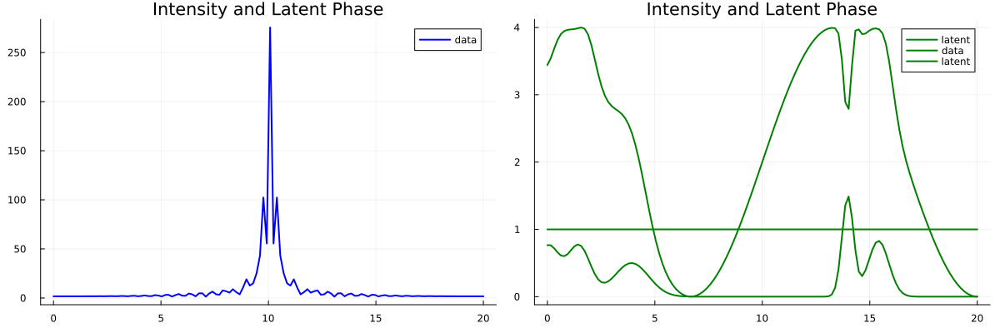

In [6]:
gaussian(x, σ) = @. exp(-x^2 / (2σ^2)) / (σ * sqrt(2π))
Random.seed!(1)
n = 2^7
N_electrons = 1_000_000
L = 20
ϵ = 0.01
y_latent = zeros(n)
x_train = collect(range(0.0, L, n))
for i in 1:5
    x0 = rand(Uniform(0, L))
    σ = rand(truncated(Normal(0, 1), 0.1, 1))
    y_latent += gaussian(x_train.-x0, σ) #.+ ϵ * randn(n)
end
# y_latent += ϵ * randn(n)
d_latent = copy(y_latent)
phi_latent = @. d_latent*1


θ_latent = 0.1 + 0.02 * randn()
println(θ_latent)
Reference_Wave(θ) = @. cis(2*π * (sin(θ)*x_train))
wave_ref = Reference_Wave(θ_latent)
# Intensity = 2 .+ cos.(y_latent)
Intensity = @. abs2(wave_ref + cis(phi_latent))
Intensity_fft = abs.(fftnshift(Intensity))
y_train = @. rand(Poisson(Intensity_fft*N_electrons))

y_reconstruction_test = abs.(ifftnshift(fftnshift(y_latent)))
# @assert y_latent ≈ y_reconstruction_test "these are not the same"

fig1 = plot(x_train, y_train./N_electrons, 
    label = "data", 
    markersize = 2, 
    color = :blue, linewidth = 2)

fig2 = plot(x_train, [d_latent, abs.(cis.(phi_latent)), Intensity], 
    label = "latent", 
    title = "Intensity and Latent Phase", 
    xlabel = "x", ylabel = "",
    markersize = 2, color = :green, linewidth = 2)


plot(fig1, fig2, layout = (1, 2), size = (1200, 400), 
    title = "Intensity and Latent Phase", 
    xlabel = "x", ylabel = "", 
    label = ["data" "latent"], 
    markersize = 2, color = [:blue :green], linewidth = 2)

\begin{align}
    |\psi_r + e^{i\phi (1 + ik)}|^2& \\
    & = 1 + e^{{i\phi (1 + ik)}}*e^{-i\phi (1 - ik)} + 2e^{-k\phi}cos(\phi - \psi_r) \\
    & = 1 + e^{-2k\phi} + 2e^{-k\phi}\cos(\phi-\psi_r)
\end{align}

In [7]:
function D1(y::AbstractVector)
    n  = length(y)
    d1 = similar(y)            # will hold the second derivative at each node

    # --- boundaries ---------------------------------------------------------
    d1[1] = (-3*y[1] + 4*y[2] - y[3])/2               # forward

    # --- interior: 3-point centred -----------------------------------------
    @inbounds for i in 2:n-1
        d1[i] = (y[i+1] - y[i-1])/2
    end

    # --- trailing boundary rows --------------------------------------------
    d1[n]   = (y[n-2] - 4*y[n-1] + 3*y[n])/2            # backward
    return d1
end

D1 (generic function with 1 method)

In [8]:

Trapz(y::AbstractVector) = sum(y) - (y[end]+y[1])/2
function CumTrapz(y::AbstractVector)
    n = length(y)
    result = zeros(eltype(y), n)  # First element is 0 (no area yet)
    
    # Compute cumulative integral
    for i in 2:n
        result[i] = result[i-1] + (y[i] + y[i-1])/2
    end
    
    return result
end
function CumTrapz(y::AbstractVector, x::AbstractVector)
    n = length(y)
    @assert length(x) == n "x and y must have the same length"
    
    result = zeros(promote_type(eltype(y), eltype(x)), n)
    
    # Compute cumulative integral
    for i in 2:n
        result[i] = result[i-1] + (y[i] + y[i-1])/2 * (x[i] - x[i-1])
    end
    
    return result
end

CumTrapz (generic function with 2 methods)

3.138562340400677 0.010769507866310864


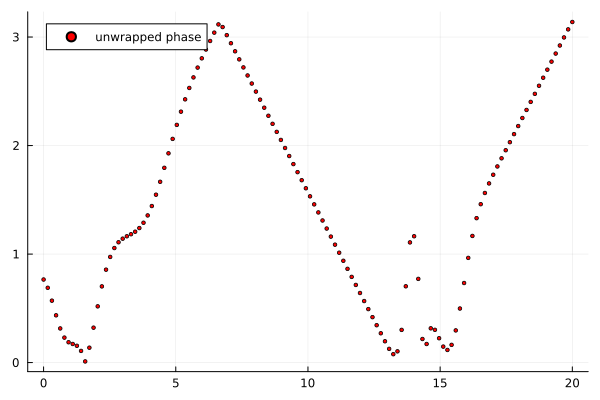

In [9]:
using Unwrap
wave_ref_unwrapped = unwrap(angle.(wave_ref))
phi_model = @. acos(Intensity ./ 2 .- 1.0)
diff_phi = D1(phi_model)
ddiff_phi = D1(diff_phi)
phi_reconstructed = CumTrapz(CumTrapz(ddiff_phi))
println(maximum(phi_model), " ", minimum(phi_model))
scatter(x_train, [phi_model], 
    label = "unwrapped phase", 
    markersize = 2, color = :red, linewidth = 2)

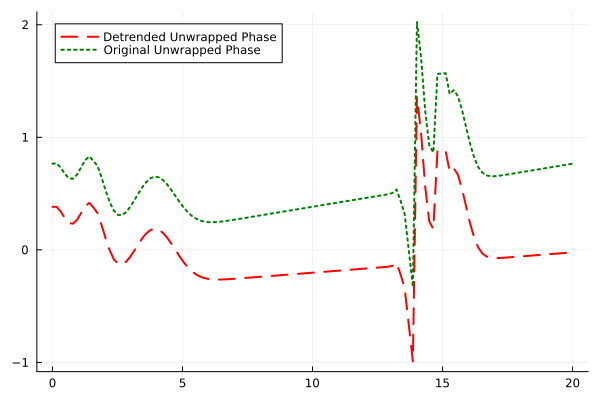

In [10]:
# Given intensity pattern with reference wave information
cos_phi = Intensity ./ 2 .- 1.0
# Get gradient to determine sign changes
dphi = D1(cos_phi)
# Estimate sine from cosine with sign from gradidiff_phient
sin_phi = sqrt.(1 .- cos_phi.^2) .* sign.(dphi)
# Get full phase using atan2
phi_full = atan.(sin_phi, cos_phi)
# Unwrap to remove 2π jumps
phi_unwrapped = unwrap(phi_full)
slope = (phi_unwrapped[end]-phi_unwrapped[1])/(x_train[end]-x_train[1])
phi_unwrapped_mine = phi_unwrapped .- x_train.*slope
using LinearAlgebra
A = [x_train ones(length(x_train))]
coeffs = A \ phi_unwrapped
phi_unwrapped_detrended = phi_unwrapped - (coeffs[1] * x_train .+ coeffs[2])
# Visualize
plot(x_train, phi_unwrapped_detrended, 
    label="Detrended Unwrapped Phase", 
    markersize=4, color=:red, linewidth=2, linestyle=:dash)
plot!(x_train, phi_unwrapped_mine, 
    label="Original Unwrapped Phase", 
    markersize=4, color=:green, linewidth=2, linestyle=:dot)

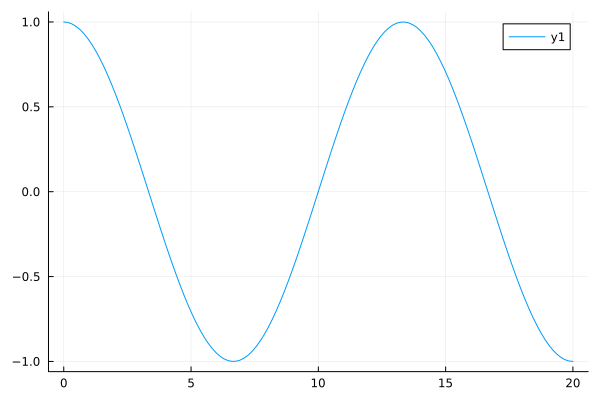

In [11]:
# Assuming wave_ref contains phase information of your reference wave
ref_phase = angle.(wave_ref)
# Extract complex amplitude
amplitude = sqrt.(Intensity)
# Reconstruct signal with reference phase as guide
phi_full = cos.(unwrap(angle.(amplitude .* exp.(im * ref_phase))))
plot(x_train, phi_full)

In [12]:
using BSplines
using Pkg
# Pkg.add("StatsFuns")
spacing = 1
order = 3  # Cubic B-splines
N_knots = length(x_train[1:spacing:end])
knots_list = x_train[1:spacing:end]
basis = BSplineBasis(order, knots_list)
N_basis = length(basis)
Link(z) = π/2 * logistic(z)

Link (generic function with 1 method)

In [13]:
using ReverseDiff
using Turing
using Distributions
using BSplines
using Statistics: mean, median
using LogExpFunctions



@model function latent_model(y, x_input=x_train, N_poisson=N_electrons)
    # θ ~ truncated(Normal(0.2, 1), 0, π/2)
    # λ_test ~ Gamma(1.0, 1e-2)
    λ_test ~ truncated(Normal(0.0, 0.01), lower = 1e-9)

    # μ ~ Uniform(0, π/2)
    θ_learn ~ truncated(Normal(0.1, 1), 0, π/3)
    weights ~ filldist(Uniform(-10, 10), length(basis))
    
    wrapped = @. Link($Spline(basis, weights)(x_input))
    local wr = Reference_Wave(θ_latent)
    local I = @. abs($fftnshift(   abs2(wr + cis(wrapped))  ))* N_poisson


    
    """
    the first and last point are O(h^2) accurate, 
    the interior points are O(h^4)
    """
    @views begin
        n  = length(weights)
        d2 = similar(weights)            # will hold the second derivative at each node

        # --- boundaries ---------------------------------------------------------
        #d2[1] =  weights[1] - 2*weights[2] + weights[3]                 # forward
        d2[1] =  2*weights[1] - 5*weights[2] + 4*weights[3] - weights[4]                # forward
        d2[2] =  weights[1] - 2*weights[2] + weights[3]                 # 3-pt centred

        # --- interior: 5-point centred -----------------------------------------
        @inbounds for i in 3:n-2
            d2[i] = ( -weights[i-2] + 16*weights[i-1] -
                    30*weights[i] + 16*weights[i+1] - weights[i+2] ) / 12
        end

        # --- trailing boundary rows --------------------------------------------
        d2[n-1] = weights[n-2] - 2*weights[n-1] + weights[n]            # 3-pt centred
        d2[n]   = 2*weights[end] - 5*weights[end-1] + 4*weights[end-2] - weights[end-3]             # backward
        #d2[n]   = weights[n-2] - 2*weights[n-1] + weights[n]            # backward
    end

    Turing.@addlogprob! -inv(λ_test) * sum(abs2, d2)       # single penalty, no duplicates
    Turing.@addlogprob! sum(logpdf.(Poisson.(I), y))  # ← scales by N

    # y ~ arraydist(Poisson.(I))
end

# for (i, λ) in enumerate(λs)
#     latent_phis[i, :], weights_samples[i,:], chain = model_lambda(λ)
# end

latent_model (generic function with 6 methods)

In [14]:
methods(Turing.sample)

# 44 methods for generic function "sample" from StatsBase:
  [1] sample(rng::AbstractRNG, wv::AbstractWeights)
     @ ~/.julia/packages/StatsBase/XgjIN/src/sampling.jl:552
  [2] sample(rng::AbstractRNG, chn::Chains, n::Integer; replace, ordered)
     @ MCMCChains ~/.julia/packages/MCMCChains/RIFg4/src/sampling.jl:26
  [3] sample(rng::AbstractRNG, chn::Chains, wv::AbstractWeights, n::Integer; replace, ordered)
     @ MCMCChains ~/.julia/packages/MCMCChains/RIFg4/src/sampling.jl:37
  [4] sample(rng::AbstractRNG, a::AbstractArray{T}, dims::NTuple{N, Int64} where N; replace, ordered) where T
     @ ~/.julia/packages/StatsBase/XgjIN/src/sampling.jl:530
  [5] sample(rng::AbstractRNG, a::AbstractArray{T}, n::Integer; replace, ordered) where T
     @ ~/.julia/packages/StatsBase/XgjIN/src/sampling.jl:509
  [6] sample(rng::AbstractRNG, a::AbstractArray)
     @ ~/.julia/packages/StatsBase/XgjIN/src/sampling.jl:431
  [7] sample(rng::AbstractRNG, a::AbstractArray, wv::AbstractWeights)
     @ ~/.julia/packages/StatsBase/XgjIN/src/sampling.jl:565
  [8] sample(rng::AbstractRNG, a::AbstractArray{T}, wv::AbstractWeights, n::Integer; replace, ordered) where T
     @ ~/.julia/packages/StatsBase/XgjIN/src/sampling.jl:937
  [9] sample(rng::AbstractRNG, a::AbstractArray{T}, wv::AbstractWeights, dims::NTuple{N, Int64} where N; replace, ordered) where T
     @ ~/.julia/packages/StatsBase/XgjIN/src/sampling.jl:944
 [10] sample(rng::AbstractRNG, model::AbstractMCMC.AbstractModel, alg::Prior, ensemble::AbstractMCMC.AbstractMCMCEnsemble, N::Integer, n_chains::Integer; chain_type, progress, kwargs...)
     @ Turing.Inference ~/.julia/packages/Turing/UCuzt/src/mcmc/Inference.jl:269
 [11] sample(rng::AbstractRNG, model::AbstractMCMC.AbstractModel, alg::Prior, N::Integer; chain_type, resume_from, progress, kwargs...)
     @ Turing.Inference ~/.julia/packages/Turing/UCuzt/src/mcmc/Inference.jl:211
 [12] sample(rng::AbstractRNG, model::AbstractMCMC.AbstractModel, alg::Turing.Inference.InferenceAlgorithm, N::Integer; kwargs...)
     @ Turing.Inference ~/.julia/packages/Turing/UCuzt/src/mcmc/Inference.jl:183
 [13] sample(rng::AbstractRNG, model::AbstractMCMC.AbstractModel, alg::Turing.Inference.InferenceAlgorithm, ensemble::AbstractMCMC.AbstractMCMCEnsemble, N::Integer, n_chains::Integer; kwargs...)
     @ Turing.Inference ~/.julia/packages/Turing/UCuzt/src/mcmc/Inference.jl:241
 [14] sample(rng::AbstractRNG, model::AbstractMCMC.AbstractModel, sampler::AdvancedPS.SMC; kwargs...)
     @ AdvancedPS ~/.julia/packages/AdvancedPS/Vox9w/src/smc.jl:33
 [15] sample(rng::AbstractRNG, model::AbstractMCMC.AbstractModel, sampler::DynamicPPL.Sampler{<:Turing.Inference.InferenceAlgorithm}, ensemble::AbstractMCMC.AbstractMCMCEnsemble, N::Integer, n_chains::Integer; chain_type, progress, kwargs...)
     @ Turing.Inference ~/.julia/packages/Turing/UCuzt/src/mcmc/Inference.jl:254
 [16] sample(rng::AbstractRNG, model::AbstractMCMC.LogDensityModel, sampler::AdvancedHMC.AbstractHMCSampler, parallel::AbstractMCMC.AbstractMCMCEnsemble, N::Integer, nchains::Integer; n_adapts, progress, verbose, callback, kwargs...)
     @ AdvancedHMC ~/.julia/packages/AdvancedHMC/dgxuI/src/abstractmcmc.jl:68
 [17] sample(rng::AbstractRNG, model::AbstractMCMC.AbstractModel, sampler::AbstractMCMC.AbstractSampler, parallel::AbstractMCMC.AbstractMCMCEnsemble, N::Integer, nchains::Integer; kwargs...)
     @ AbstractMCMC ~/.julia/packages/AbstractMCMC/fWWW0/src/sample.jl:81
 [18] sample(rng::AbstractRNG, model::AbstractMCMC.AbstractModel, sampler::DynamicPPL.Sampler{<:Turing.Inference.AdaptiveHamiltonian}, N::Integer; chain_type, resume_from, progress, nadapts, discard_adapt, discard_initial, kwargs...)
     @ Turing.Inference ~/.julia/packages/Turing/UCuzt/src/mcmc/hmc.jl:91
 [19] sample(rng::AbstractRNG, model::AbstractMCMC.AbstractModel, sampler::DynamicPPL.Sampler{<:SMC}, N::Integer; chain_type, resume_from, progress, kwargs...)
     @ Turing.Inference ~/.julia/packages/Turing/UCuzt/src/mcmc/particle_mcmc

In [15]:
methods(Gibbs)

# 2 methods for type constructor:
 [1] Gibbs(alg1::Union{Turing.Inference.InferenceAlgorithm, GibbsConditional}, algrest::Vararg{Union{Turing.Inference.InferenceAlgorithm, GibbsConditional}, N}) where N
     @ ~/.julia/packages/Turing/UCuzt/src/mcmc/gibbs.jl:59
 [2] Gibbs(arg1::Tuple{Union{Turing.Inference.InferenceAlgorithm, GibbsConditional}, Int64}, argrest::Vararg{Tuple{Union{Turing.Inference.InferenceAlgorithm, GibbsConditional}, Int64}, N}) where N
     @ ~/.julia/packages/Turing/UCuzt/src/mcmc/gibbs.jl:67

In [16]:
using AdvancedHMC
using AdvancedMH
methods(AdvancedMH.RobustAdaptiveMetropolis)

UndefVarError: UndefVarError: `RobustAdaptiveMetropolis` not defined in `AdvancedMH`
Suggestion: check for spelling errors or missing imports.

In [38]:
using AdvancedHMC
using AdvancedMH
using ADTypes


model = latent_model(y_train, x_train, N_electrons)
n_adapts  = 1_000        # dual-averaging warm-up steps
δ_target  = 0.65         # target accept rate


counter = 0
function custom_learning(x,counter = counter)
    counter += 1
    Normal(x, 1/(counter)^(0.45))
end 


"""
    mutable struct AdaptiveProposal

A callable object that, given the current state `x`, returns a
`Normal(x, σ)` proposal whose scale reacts to recent |Δx|²
and shrinks only slowly with iteration count.
"""
mutable struct AdaptiveProposal
    counter::Int          # iterations seen
    prev::Float64         # previous x
    ewvar::Float64        # EW variance of step sizes
    α::Float64            # smoothing factor for EW variance
    minsigma::Float64     # lower bound to avoid degeneracy
end
xs = []

# call operator -------------------------------------------------------------
function (ap::AdaptiveProposal)(x::Real)
    Δ = x - ap.prev                         # most recent jump
    ap.ewvar = (1 - ap.α)*ap.ewvar + ap.α*Δ^2   # EW variance update
    ap.prev = x
    ap.counter += 1
    push!(xs, x)

    # proposal scale:  √(local-variance)  /  (counter^0.35)
    σ = max(sqrt(ap.ewvar), ap.minsigma)/ log1p(ap.counter)
    return Normal(x, σ)
end

# constructor ---------------------------------------------------------------
AdaptiveProposal(init_x; α = 0.01, minsigma = 1e-2) =
    AdaptiveProposal(0, init_x, 0.3, α, minsigma)
ap  = AdaptiveProposal(1.2)                 # keeper of EW-variance etc.
prop = StaticProposal(x -> ap(x))           # <- FUNCTION wrapper ✔

# sampler = Gibbs(
#     (:λ_test, :weights) => Turing.NUTS(n_adapts, δ_target, max_depth=6; adtype=AutoReverseDiff(true)),
#     :θ_learn => Turing.NUTS(n_adapts, δ_target, max_depth=14; adtype=AutoForwardDiff()))
# sampler = Gibbs(
#     (:λ_test, :weights) => Turing.NUTS(n_adapts, δ_target, max_depth=6; adtype=AutoReverseDiff(true)),
#     :θ_learn => Turing.PG(20))
# sampler = Gibbs(
#     (:λ_test, :weights) => Turing.HMC(0.1, 10; adtype=AutoReverseDiff(true)),
#     :θ_learn => Turing.MH(:θ_learn => prop))


# sampler = Gibbs(

#     # 1. λ_test with NUTS
#     #    · 0.65  = target acceptance rate δ  (first positional)
#     #    · :λ_test  is the variable the NUTS sweep should update  (second positional)
#     #    · the real keywords follow *after* the semicolon
#     Turing.NUTS(0.65, space=:λ_test; max_depth = 6, adtype = AutoReverseDiff(true)),

#     # 2. θ_learn with Metropolis–Hastings
#     MH(:θ_learn),

#     # 3. weights with another NUTS sweep
#     Turing.NUTS(0.65, space=:weights; max_depth = 6, adtype = AutoReverseDiff(true))
# )
# sampler = Gibbs((:λ_test, :weights) => Turing.NUTS(n_adapts, δ_target, max_depth=6; adtype=AutoReverseDiff(true)),
#                 :θ_learn => Turing.NUTS(n_adapts, δ_target; adtype=AutoReverseDiff(true)))
# res = AdvancedPS.ResampleWithESSThreshold(resample_systematic, 0.7)
# sampler = Gibbs(:θ_learn => RepeatSampler(Turing.PG(100, 0.5),5),
#     (:λ_test, :weights) => Turing.NUTS(n_adapts, δ_target, max_depth=6; adtype=AutoReverseDiff(true)))
# sampler = PG(20)
# initial_params=init_params
#init_params = fill(-3.0, length(basis) + 2)pre
# sampler = Turing.NUTS(n_adapts, δ_target; max_depth=6, adtype=AutoReverseDiff(true))
# init_params = fill(-4.0, length(basis) )  # Array of 10 numbers
n_adapts  = 1_000        # dual-averaging warm-up steps
δ_target  = 0.65         # target accept rate
ϵ0 = 0.01
# sampler_nuts = externalsampler(AdvancedHMC.NUTS(δ_target, max_depth=6, metric=:dense), adtype=AutoReverseDiff(true))

D = length(basis) + 2
metric = DenseEuclideanMetric(D)
kernel = HMCKernel(Trajectory{MultinomialTS}(Leapfrog(ϵ0), ClassicNoUTurn(max_depth=7)))
# kernel = HMCKernel(Trajectory{MultinomialTS}(integrator, GeneralisedNoUTurn()))
mma = MassMatrixAdaptor(metric)
ssa = StepSizeAdaptor(δ_target, Leapfrog(ϵ0))
adaptor = StanHMCAdaptor(mma, ssa)
hmcsampler = AdvancedHMC.HMCSampler(kernel, metric, adaptor)  
nuts = externalsampler(hmcsampler)




init_params = rand(Uniform(-3, -2.9), length(basis) + 2)  # Array of 10 numbers
init_params[1] = 1e-3
init_params[2] = 0.075
initial_params = init_params
initial_params = [init_params for i in 1:3]
n_samples = 15_200
n_adapts = 3_000
chain = sample(model, nuts, MCMCThreads(), n_samples, 3; 
                                        progress=true, 
                                        initial_params=initial_params, 
                                        n_adapts=n_adapts, 
                                        adtype=AutoReverseDiff(true))
# chain = sample(model, sampler, 3_000; progress=true, initial_params=initial_params)

Sampling (3 threads)   0%|                              |  ETA: N/A
Sampling (3 threads)  33%|██████████                    |  ETA: 0:02:56
Sampling (3 threads)  67%|████████████████████          |  ETA: 0:00:52
Sampling (3 threads) 100%|██████████████████████████████| Time: 0:04:08
Sampling (3 threads) 100%|██████████████████████████████| Time: 0:04:08


Chains MCMC chain (15200×144×3 Array{Float64, 3}):

Iterations        = 1:1:15200
Number of chains  = 3
Samples per chain = 15200
Wall duration     = 245.78 seconds
Compute duration  = 431.15 seconds
parameters        = λ_test, θ_learn, weights[1], weights[2], weights[3], weights[4], weights[5], weights[6], weights[7], weights[8], weights[9], weights[10], weights[11], weights[12], weights[13], weights[14], weights[15], weights[16], weights[17], weights[18], weights[19], weights[20], weights[21], weights[22], weights[23], weights[24], weights[25], weights[26], weights[27], weights[28], weights[29], weights[30], weights[31], weights[32], weights[33], weights[34], weights[35], weights[36], weights[37], weights[38], weights[39], weights[40], weights[41], weights[42], weights[43], weights[44], weights[45], weights[46], weights[47], weights[48], weights[49], weights[50], weights[51], weights[52], weights[53], weights[54], weights[55], weights[56], weights[57], weights[58], weights[59], weigh

In [19]:
# After

# Access specific elements
current_metric = get_hmc_metric(state)

UndefVarError: UndefVarError: `get_hmc_metric` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [37]:
AdvancedHMC.HMCState(hmcsampler)

MethodError: MethodError: no method matching AdvancedHMC.HMCState(::HMCSampler{HMCKernel{AdvancedHMC.FullMomentumRefreshment, Trajectory{MultinomialTS, Leapfrog{Float64}, ClassicNoUTurn{Float64}}}, DenseEuclideanMetric{Float64, Vector{Float64}, Matrix{Float64}, UpperTriangular{Float64, Matrix{Float64}}}, StanHMCAdaptor{WelfordCov{Float64}, NesterovDualAveraging{Float64}}})
The type `AdvancedHMC.HMCState` exists, but no method is defined for this combination of argument types when trying to construct it.

Closest candidates are:
  AdvancedHMC.HMCState(!Matched::Int64, !Matched::TTrans, !Matched::TMetric, !Matched::TKernel, !Matched::TAdapt) where {TTrans<:AdvancedHMC.Transition, TMetric<:AdvancedHMC.AbstractMetric, TKernel<:AdvancedHMC.AbstractMCMCKernel, TAdapt<:AdvancedHMC.Adaptation.AbstractAdaptor}
   @ AdvancedHMC ~/.julia/packages/AdvancedHMC/dgxuI/src/abstractmcmc.jl:17


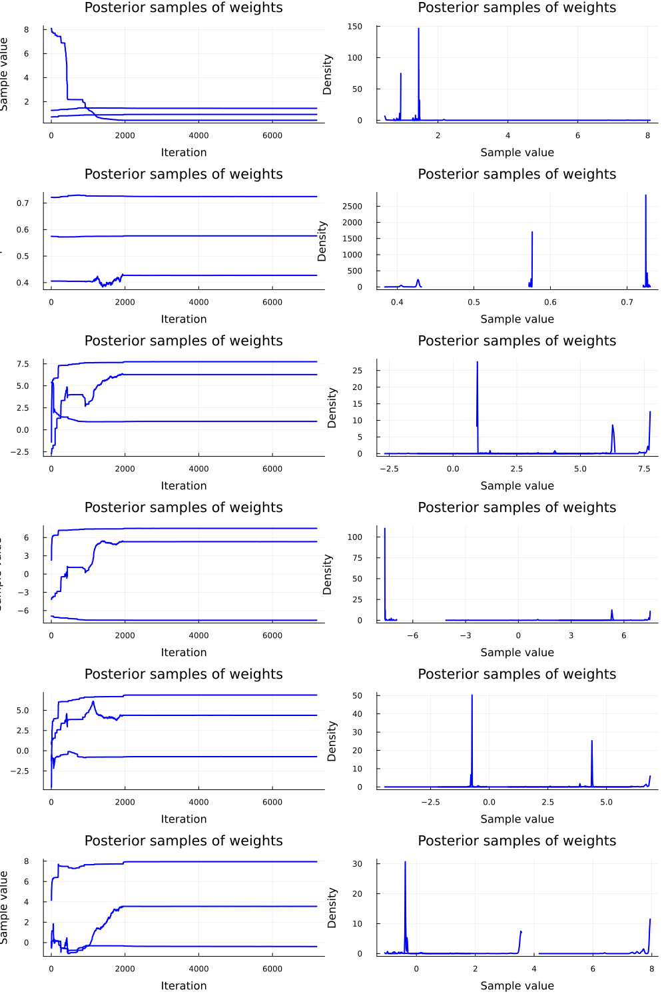

In [31]:
using StatsPlots
plot(chain[:,1:6,:], 
    title = "Posterior samples of weights", 
    xlabel = "Iterations", ylabel = "Weights", 
    label = ["w[$i]" for i in 1:10], 
    markersize = 2, color = :blue, linewidth = 2)

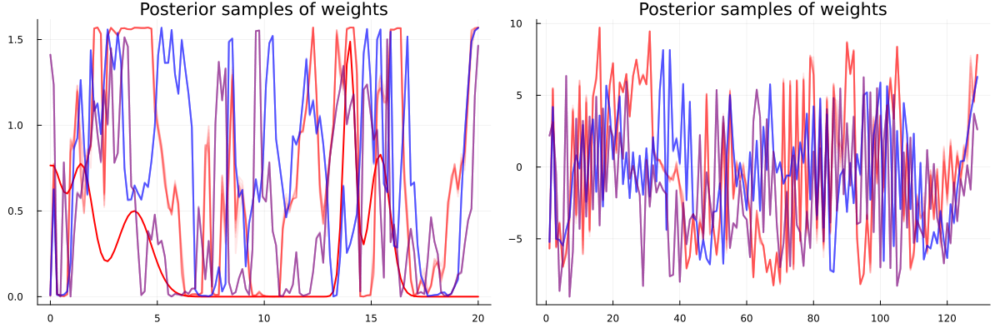

In [21]:
weights_samples = reduce(hcat, [chain[Symbol("weights[$i]")] for i in 1:length(basis)])
mode_weights = mapslices(x -> median(x), weights_samples, dims=1) |> vec
init_params = mode_weights
# global_samples = 1000
# Extract weights for iteration 100
fig1 = plot(x_train, d_latent, 
        # label = "λ = $(λs[1])", 
        markersize = 2, color = :red, linewidth = 2)
fig2 = plot()
colors = [:red, :blue, :purple]
for chn in 1:3
    for k in n_samples-1000:100:n_samples
        weight_values = [chain[k, Symbol("weights[$i]"), chn] for i in 1:length(basis)]
        reconstructed_spline = Spline(basis, weight_values)
    #     phi_reconstructed = Link.(reconstructed_spline.(x_train))
        phi_reconstructed = (Link.(reconstructed_spline.(x_train)))


        plot!(fig1, x_train, phi_reconstructed, 
            title = "Posterior samples of weights", 
            xlabel = "", ylabel = "", 
            markersize = 2, color =colors[chn], linewidth = 2, alpha =0.1)
        plot!(fig2,weight_values, 
            title = "Posterior samples of weights", 
            xlabel = "", ylabel = "", 
            markersize = 2, color = colors[chn], linewidth = 2, alpha =0.1)
        
    end
end
# plot!(legend=false)
plot(fig1, fig2, layout = (1, 2), size = (1200, 400), 
    title = "Posterior samples of weights", 
    xlabel = "x", ylabel = "", 
    label ="", 
    markersize = 2, color = [:red :blue], linewidth = 2)

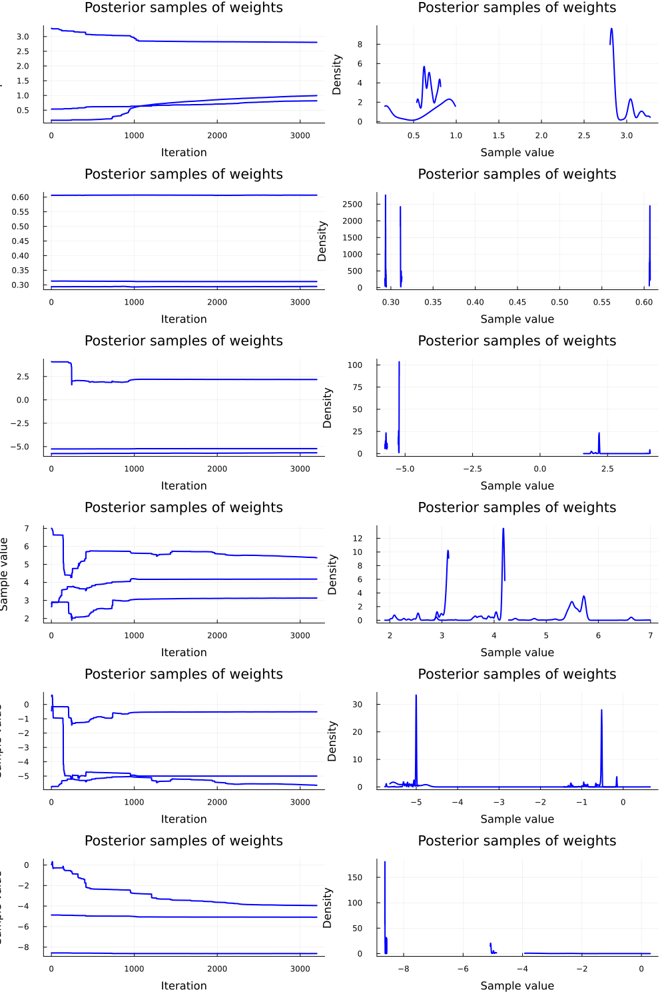

In [22]:
using StatsPlots
plot(chain[:,1:6,:], 
    title = "Posterior samples of weights", 
    xlabel = "Iterations", ylabel = "Weights", 
    # label = ["w[$i]" for i in 1:10], 
    markersize = 2, color = :blue, linewidth = 2)